## Nevrita Natasya Putriana
## 23/514635/TK/56500
## Kelas B
__________________________________________________________________________________

## SINGULAR VALUE DECOMPOSITION (SVD)

##### Singular Value Decomposition (SVD) adalah suatu metode dekomposisi matriks persegi panjang m x n. Konsep dasarnya, SVD mengubah bentuk suatu matriks yang awalnya persegi panjang (tidak simetris) menjadi matriks persegi (simetris). Nantinya, SVD akan memfaktorkan suatu matriks yang berukuran m x n menjadi matriks U, Σ, dan V transpose.  

##### Berikut merupakan bentuk umum dari SVD :
### A = U Σ Vtrans

##### Keterangan :
##### U = matriks ortogonal m x m, berisi left singular vector 
##### Σ = matriks berukuran m x n yang elemen diagonal utamanya yaitu nilai-nilai singular dari matriks A dan elemen yang bukan diagonal bernilai 0, berisi singular values
##### V transpose = matriks berukuran n x n, berisi right singular vector

## ![url to photo](https://truetheta.io/assets/images/posts/svd_and_the_fundamental_theorem_of_linear_algebra/A_decomposition.png)

##### SVD memiliki banyak fungsi, diantaranya sebagai image processing, image and video coompression, machine learning, computer vision, dan digital watermarking.


## PENERAPAN SVD DALAM IMAGE PROCESSING

##### Deklarasikan gambar dan environment-nya (numpy)

In [30]:
from PIL import Image
import numpy as np
import os
import requests
import io

##### Input gambar dan deklarasikan sebagai foto_asli

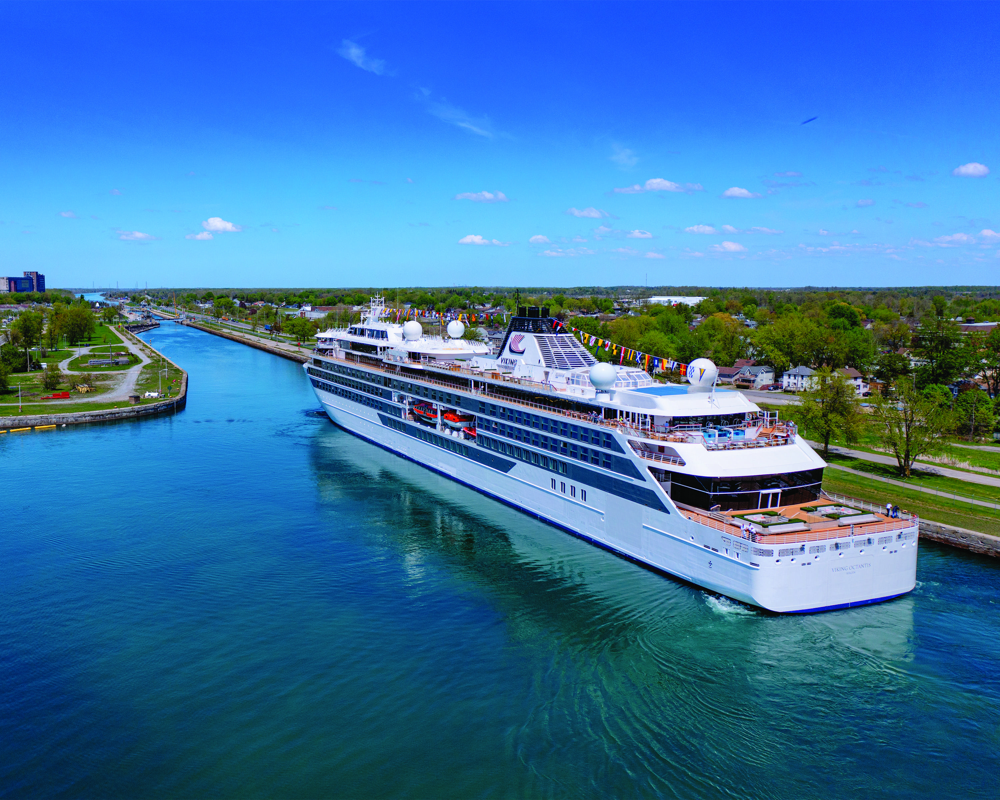

In [31]:
url = "https://github.com/nevritaasy/gambar-tugas-alin/blob/c85c04325243d784c59a4ecc61a5e3f14daf6b39/kapal.jpg?raw=true"
response = requests.get(url)
foto_asli = Image.open(io.BytesIO(response.content))
foto_asli.save("kapal.jpg")
foto_asli

##### Gambar yang awalnya berwarna diubah menjadi black and white dengan cara menambahkan .convert('L')

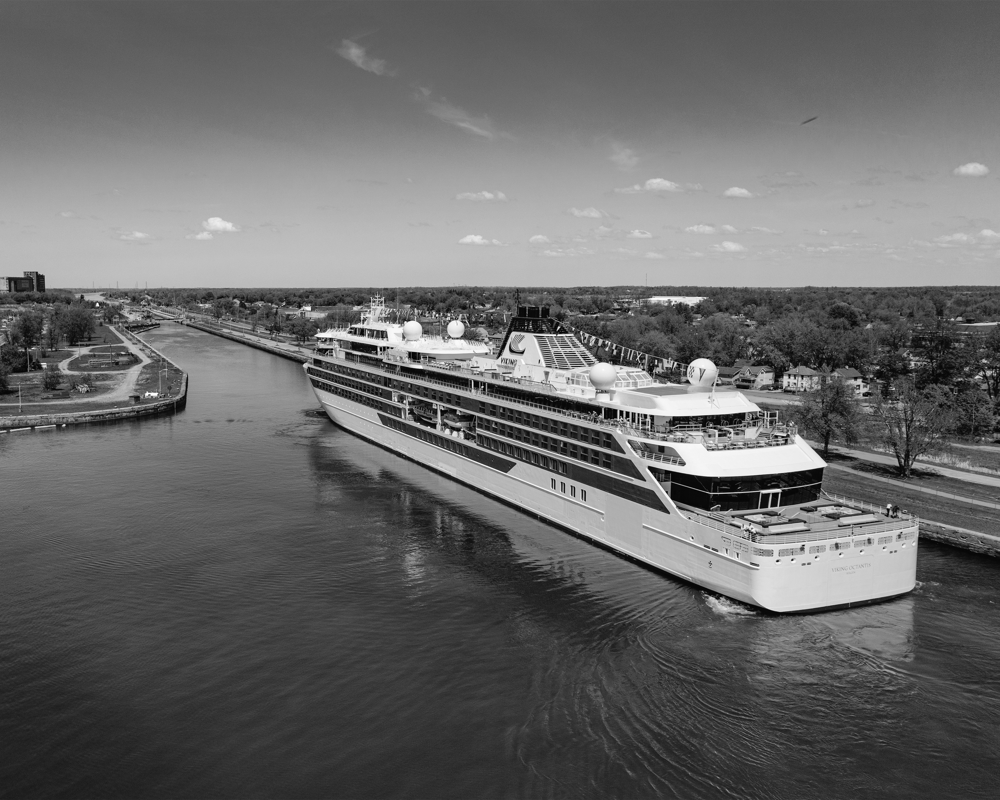

In [32]:
foto_bw = foto_asli.convert('L')
foto_bw.save ('kapal_grayscale.jpg')
foto_bw

##### Menentukan ukuran gambar aslinya dan grayscale

In [33]:
print("Ukuran gambar aslinya : ", os.path.getsize('kapal.jpg'), "bytes")
foto_bw.save('kapal_grey.jpg')
print("Ukuran gambar grayscale : ", os.path.getsize('kapal_grey.jpg'), "bytes")

Ukuran gambar aslinya :  3539852 bytes
Ukuran gambar grayscale :  1016815 bytes


##### Ubah Gambar ke Matriks

In [34]:
matriks_satu = np.array(foto_bw)
matriks_satu

array([[100, 108, 106, ...,  90,  90,  98],
       [ 96,  96,  90, ...,  88,  87,  85],
       [ 95,  94,  95, ...,  93,  93,  84],
       ...,
       [ 27,  34,  33, ...,  50,  43,  38],
       [ 29,  29,  28, ...,  45,  46,  38],
       [ 43,  46,  40, ...,  61,  65,  57]], dtype=uint8)

##### Menentukan U, Σ, dan V transpose

In [35]:
U, S, Vtrans = np.linalg.svd(matriks_satu, full_matrices=False)
print(U.shape, S.shape, Vtrans.shape)

(2400, 2400) (2400,) (2400, 3000)


##### Print Matriks Σ

In [36]:
print(S)

[2.99709066e+05 4.77601444e+04 2.94855565e+04 ... 6.18789009e+00
 6.16864295e+00 5.95191078e+00]


##### Meng-compress gambar awal dengan cara memotong matriks awal dengan mengalikannya oleh nilai k (k=200)

In [37]:
k = 200
U_k = U[:,:k]
S_k = S[:k]
Vtrans_k = Vtrans[:k,:]

print(U_k.shape, S_k.shape, Vtrans_k.shape)

#ubah S_k jadi matriks diagonal
S_k = np.diag(S_k)

matriks_dua = np.dot(np.dot(U_k, S_k), Vtrans_k)
matriks_dua

(2400, 200) (200,) (200, 3000)


array([[103.07620941, 103.49408554, 102.96810833, ...,  94.11316187,
         94.00318791,  93.86191405],
       [ 92.50953753,  93.1803096 ,  93.18040909, ...,  86.47350755,
         86.03750801,  85.69864336],
       [ 91.54052275,  91.56568413,  91.47679959, ...,  87.52452867,
         87.42819226,  87.12154203],
       ...,
       [ 30.60496477,  31.08859285,  31.65506134, ...,  42.03857388,
         42.63251874,  44.88398472],
       [ 29.77273506,  29.95292652,  29.16458296, ...,  42.23420492,
         42.88120331,  45.76111636],
       [ 37.26350296,  37.58609098,  37.28484963, ...,  52.80188133,
         53.42898885,  55.88166866]])

##### Menghapus nilai matriks yang tidak sesuai dan memastikan bahwa nilai berada di antara 0, 255
##### Lalu, ubah matriks tersebut ke dalam bentuk gambar

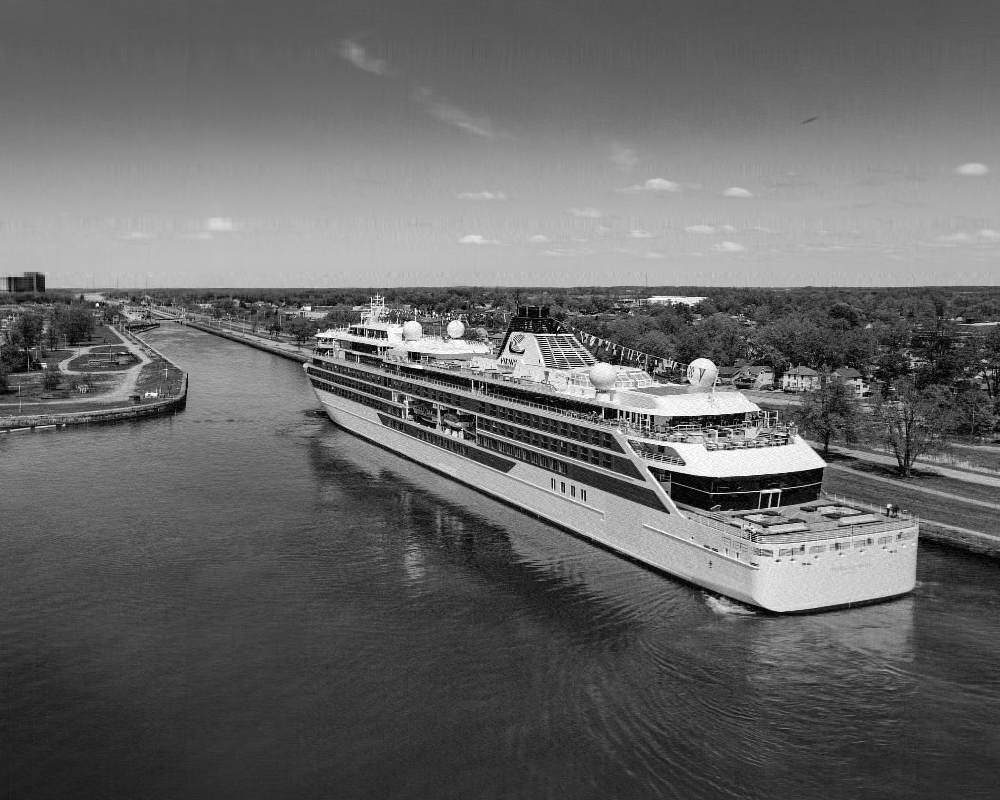

In [39]:
matriks_dua = np.clip(matriks_dua, 0, 255)

#ubah menjadi ke type uint8
matriks_dua = matriks_dua.astype(np.uint8)

foto_dua = Image.fromarray(matriks_dua)
foto_dua

##### Menampilkan ukuran gambar awal, gambar ketika grayscale, dan gambar setelah dicompressed

In [40]:
foto_dua.save('compress_kapal.jpg')

print("Gambar Awal :", os.path.getsize('kapal.jpg'), "bytes")
print("Greyscale :", os.path.getsize('kapal_grey.jpg'), "bytes")
print("Compressed :", os.path.getsize('compress_kapal.jpg'), "bytes")

Gambar Awal : 3539852 bytes
Greyscale : 1016815 bytes
Compressed : 765342 bytes


##### Dapat disimpulkan bahwa gambar yang dicompressed akan menghasilkan kualitas yang lebih buruk karena tujuannya menjadikan ukuran gambar yang disimpan lebih kecil daripada gambar aslinya. 